# Test Inference for HED Model
---

In [36]:
%matplotlib inline
# import torch libraries
import torch
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import pylab
import numpy as np
import pandas as pd
from PIL import Image
import skimage.io as io
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
# import the utility functions
from model import HED
from dataproc import TestDataset

In [16]:
# fix random seed
rng = np.random.RandomState(37148)

In [17]:
import os
print(os.getcwd())

/home/arnab/tinkering-projects/pytorch-hed


### Load Trained Model

In [25]:
# create instance of HED model
net = HED()
net.cuda()

# load the weights for the model
net.load_state_dict(torch.load('./train/HED.pth'))
net.eval()

HED(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
  )
  (conv2): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ReLU(inplace)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace)
  )
  (conv3): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ReLU(inplace)
    (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace)
    (5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
  )
  (conv4): Sequential(
    (0): MaxPool2d(kernel_size=

### Prepare Validation Dataset

In [29]:
# batch size
nBatch = 1

# load the images dataset
dataRoot = './data/HED-BSDS/test'
std=[0.229, 0.224, 0.225]
mean=[0.485, 0.456, 0.406]

transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean,std)
            ])
# create data loaders from dataset
testPath = dataRoot+'test.lst'
testDataset = TestDataset(testPath, dataRoot,transform)
testDataloader = DataLoader(testDataset, batch_size=nBatch)

### Perform Test Inference

In [37]:
def grayTrans(img):
    img = (1-img.numpy()[0][0])*255.0
    img = (img).astype(np.uint8)
    return img

In [23]:
def plotResults(images, size):
    pylab.rcParams['figure.figsize'] = size, size
    
    nPlots = len(images)
    titles = ['HED', 'S1', 'S2', 'S3', 'S4']
    plt.figure()
    for i in range(0, len(images)):
        s=plt.subplot(1,nPlots,i+1)
        plt.imshow(images[i], cmap = cm.Greys_r)
        s.set_xticklabels([])
        s.set_yticklabels([])
        s.yaxis.set_ticks_position('none')
        s.xaxis.set_ticks_position('none')
        s.set_title(titles[i],fontsize=35)
    plt.tight_layout()
    plt.show()

('test/100039.jpg',)


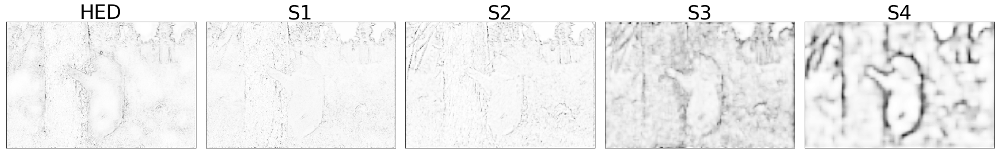

('test/100099.jpg',)
('test/10081.jpg',)
('test/101027.jpg',)
('test/101084.jpg',)
('test/102062.jpg',)
('test/103006.jpg',)
('test/103029.jpg',)
('test/103078.jpg',)
('test/104010.jpg',)
('test/104055.jpg',)


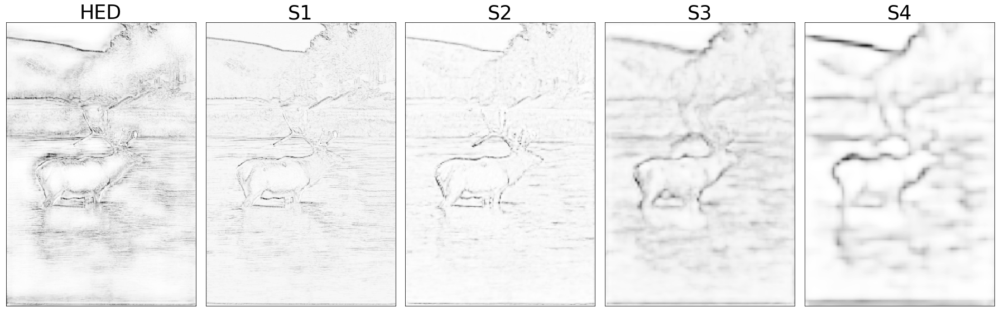

('test/105027.jpg',)
('test/106005.jpg',)
('test/106047.jpg',)
('test/107014.jpg',)
('test/107045.jpg',)
('test/107072.jpg',)
('test/108004.jpg',)
('test/108036.jpg',)
('test/108069.jpg',)
('test/109055.jpg',)


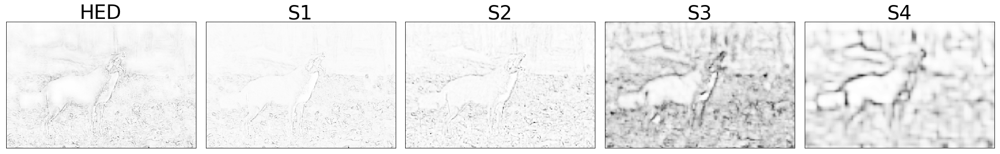

('test/112056.jpg',)
('test/112090.jpg',)
('test/117025.jpg',)
('test/118015.jpg',)
('test/118031.jpg',)
('test/118072.jpg',)
('test/120003.jpg',)
('test/120093.jpg',)
('test/123057.jpg',)
('test/128035.jpg',)


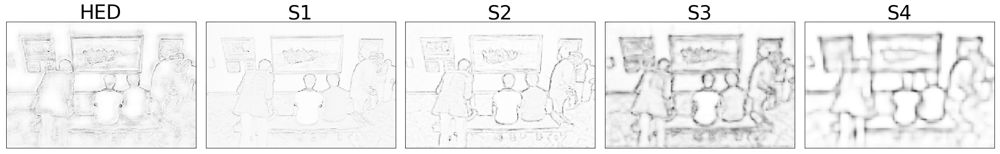

('test/130014.jpg',)
('test/130066.jpg',)
('test/134049.jpg',)
('test/134067.jpg',)
('test/140006.jpg',)
('test/140088.jpg',)
('test/14085.jpg',)
('test/14092.jpg',)
('test/141012.jpg',)
('test/141048.jpg',)


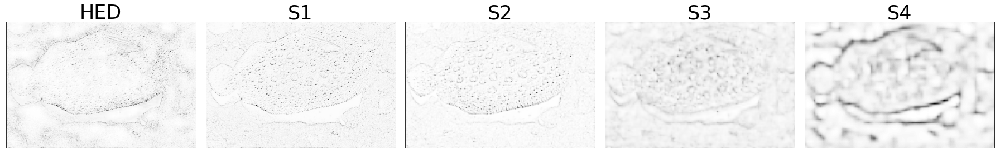

('test/145059.jpg',)
('test/145079.jpg',)
('test/146074.jpg',)
('test/147077.jpg',)
('test/147080.jpg',)
('test/15011.jpg',)
('test/15062.jpg',)
('test/156054.jpg',)
('test/157032.jpg',)
('test/157087.jpg',)


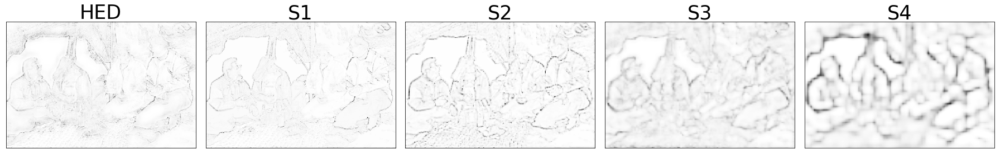

('test/159002.jpg',)
('test/159022.jpg',)
('test/160006.jpg',)
('test/16004.jpg',)
('test/160067.jpg',)
('test/16068.jpg',)
('test/161045.jpg',)
('test/163004.jpg',)
('test/163096.jpg',)
('test/164046.jpg',)


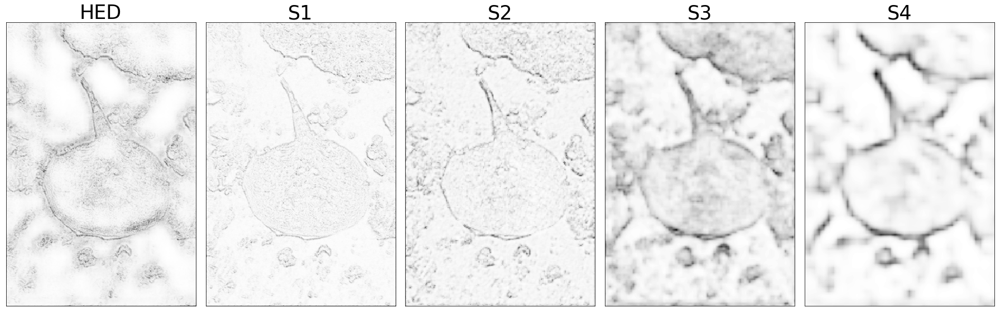

('test/168084.jpg',)
('test/17067.jpg',)
('test/175083.jpg',)
('test/176051.jpg',)
('test/179084.jpg',)
('test/181021.jpg',)
('test/183066.jpg',)
('test/185092.jpg',)
('test/187058.jpg',)
('test/187099.jpg',)


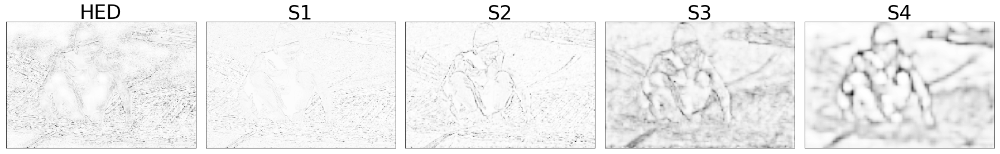

('test/188025.jpg',)
('test/189006.jpg',)
('test/189013.jpg',)
('test/189029.jpg',)
('test/189096.jpg',)
('test/196027.jpg',)
('test/196040.jpg',)
('test/196062.jpg',)
('test/196088.jpg',)
('test/198087.jpg',)


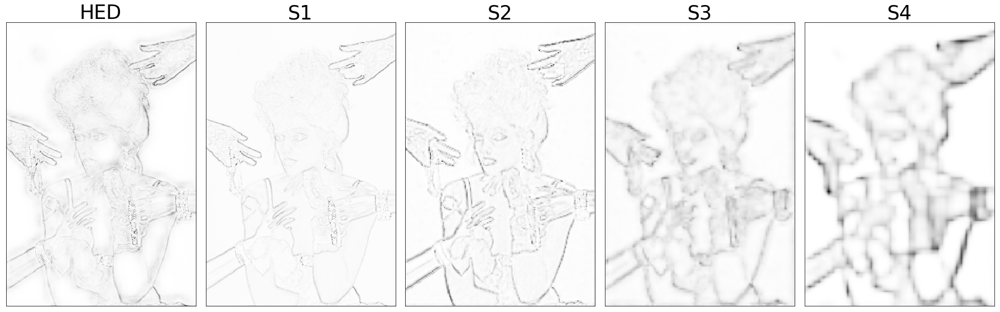

('test/20069.jpg',)
('test/201080.jpg',)
('test/2018.jpg',)
('test/202000.jpg',)
('test/206062.jpg',)
('test/206097.jpg',)
('test/207038.jpg',)
('test/207049.jpg',)
('test/208078.jpg',)
('test/209021.jpg',)


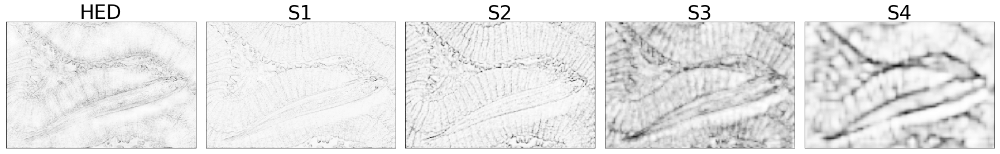

('test/217013.jpg',)
('test/217090.jpg',)
('test/220003.jpg',)
('test/223004.jpg',)
('test/223060.jpg',)
('test/225022.jpg',)
('test/226022.jpg',)
('test/226033.jpg',)
('test/226043.jpg',)
('test/226060.jpg',)


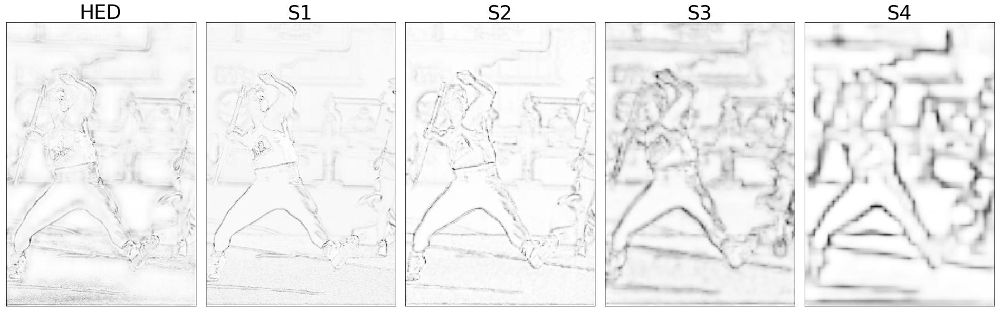

('test/228076.jpg',)
('test/230063.jpg',)
('test/230098.jpg',)
('test/23050.jpg',)
('test/232076.jpg',)
('test/235098.jpg',)
('test/238025.jpg',)
('test/243095.jpg',)
('test/246009.jpg',)
('test/247003.jpg',)


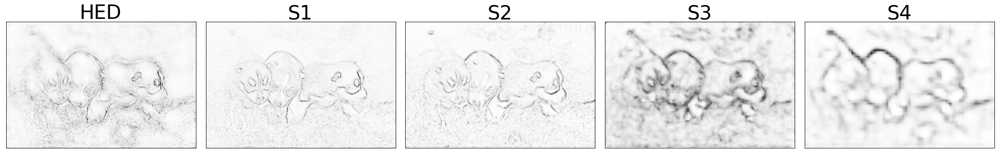

('test/247012.jpg',)
('test/249021.jpg',)
('test/250047.jpg',)
('test/250087.jpg',)
('test/253016.jpg',)
('test/253092.jpg',)
('test/257098.jpg',)
('test/258089.jpg',)
('test/259060.jpg',)
('test/267036.jpg',)


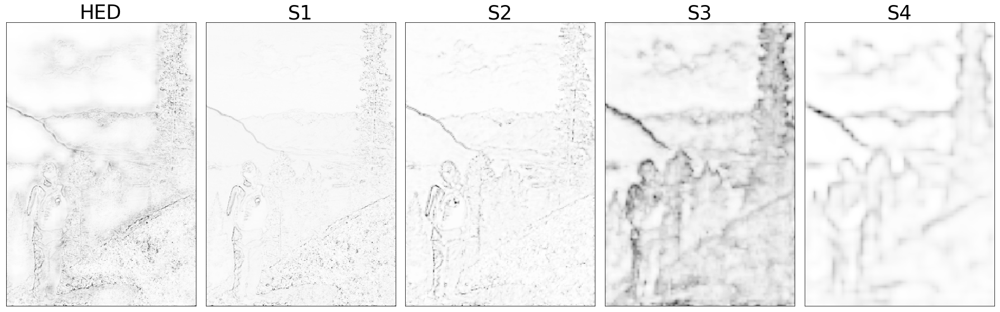

('test/268048.jpg',)
('test/268074.jpg',)
('test/277053.jpg',)
('test/279005.jpg',)
('test/28083.jpg',)
('test/281017.jpg',)
('test/285022.jpg',)
('test/288024.jpg',)
('test/289011.jpg',)
('test/290035.jpg',)


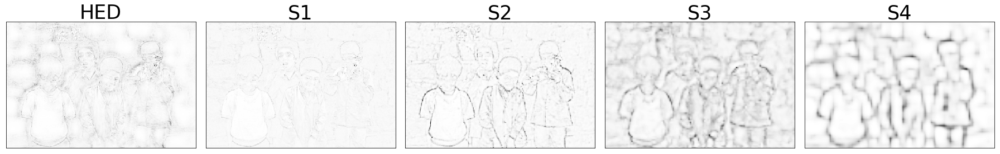

('test/29030.jpg',)
('test/296028.jpg',)
('test/296058.jpg',)
('test/302022.jpg',)
('test/306051.jpg',)
('test/306052.jpg',)
('test/3063.jpg',)
('test/309040.jpg',)
('test/317043.jpg',)
('test/326025.jpg',)


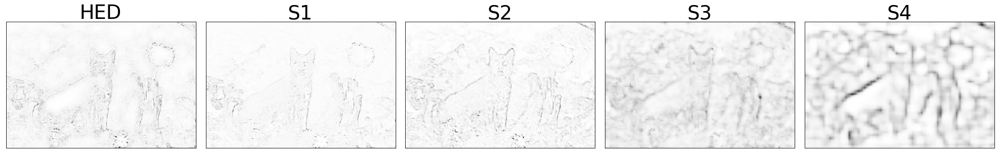

('test/326085.jpg',)
('test/33044.jpg',)
('test/334025.jpg',)
('test/335088.jpg',)
('test/335094.jpg',)
('test/344010.jpg',)
('test/346016.jpg',)
('test/347031.jpg',)
('test/35028.jpg',)
('test/35049.jpg',)


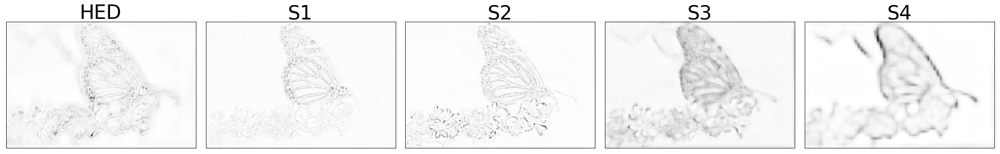

('test/36046.jpg',)
('test/365072.jpg',)
('test/368037.jpg',)
('test/372019.jpg',)
('test/376086.jpg',)
('test/384022.jpg',)
('test/384089.jpg',)
('test/385022.jpg',)
('test/388006.jpg',)
('test/388018.jpg',)


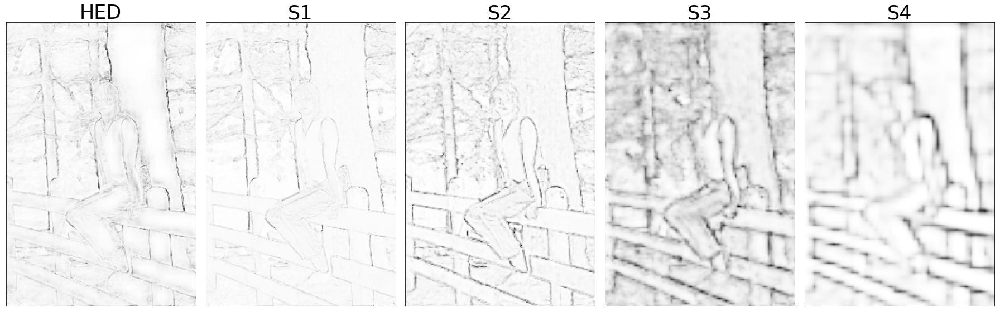

('test/388067.jpg',)
('test/393035.jpg',)
('test/41006.jpg',)
('test/41029.jpg',)
('test/41085.jpg',)
('test/41096.jpg',)
('test/43033.jpg',)
('test/43051.jpg',)
('test/45000.jpg',)
('test/48017.jpg',)


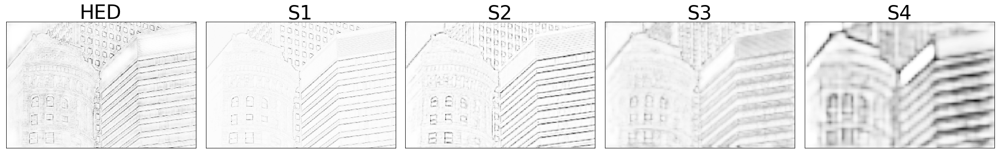

('test/48025.jpg',)
('test/49024.jpg',)
('test/5096.jpg',)
('test/51084.jpg',)
('test/6046.jpg',)
('test/61034.jpg',)
('test/64061.jpg',)
('test/65084.jpg',)
('test/69000.jpg',)
('test/69007.jpg',)


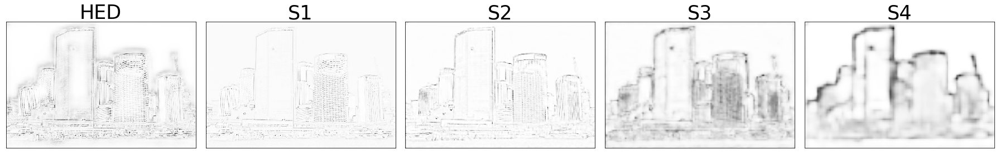

('test/69022.jpg',)
('test/70011.jpg',)
('test/70090.jpg',)
('test/71076.jpg',)
('test/71099.jpg',)
('test/77062.jpg',)
('test/78098.jpg',)
('test/79073.jpg',)
('test/80085.jpg',)
('test/80090.jpg',)


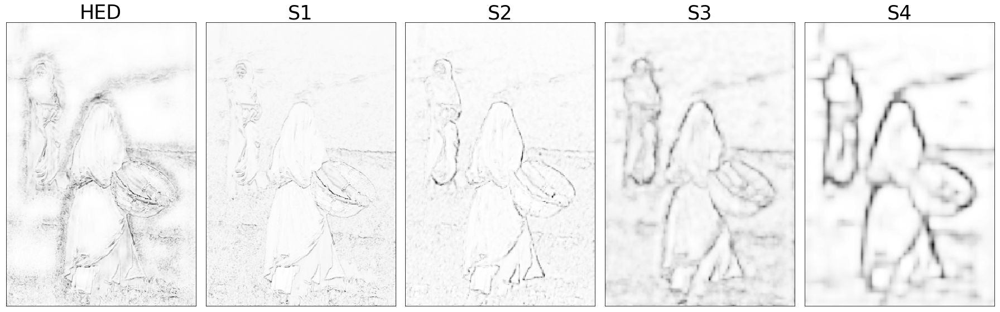

('test/8068.jpg',)
('test/81066.jpg',)
('test/81090.jpg',)
('test/81095.jpg',)
('test/87015.jpg',)
('test/92014.jpg',)
('test/94095.jpg',)
('test/97010.jpg',)


In [49]:

nVisualizenVisual  = 10
for i, sample in enumerate(testDataloader):
    # get input sample image
    inp, fname = sample
    inp = Variable(inp.cuda())
    
    # perform forward computation
    s1,s2,s3,s4,s5,s6 = net.forward(inp)
    
    # convert back to numpy arrays
    out = []
    out.append(grayTrans(s6.data.cpu()))
    out.append(grayTrans(s1.data.cpu()))
    out.append(grayTrans(s2.data.cpu()))
    out.append(grayTrans(s3.data.cpu()))
    out.append(grayTrans(s4.data.cpu()))

    print(fname)
    img = Image.fromarray(out[0], 'L')
    img.save(fname[0].split('.',1)[0]+'.png')

    # visualize every 10th image
    if i%nVisualize == 0:
        plotResults(out, 25)